
<h1><center>Final Project Soccer Analysis</center></h1>
<h3><center>Brian McCabe & Liam Pronovost</center></h3>

<img src="http://24.media.tumblr.com/95b7a20871a9d6df5e0dc702b6bb3b4e/tumblr_n71nutPA1v1ru5h8co1_500.gif" width=425 height=200 />

**Import pagages needed for analysis and visualizations**

In [180]:
import pandas as pd
import numpy as np
import seaborn as sns
from pandas_profiling import ProfileReport
import dtale
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

**Import the dataset into local dataframe using webscraping and examine its features**  
Removed unneeded data from the initial dataframe

In [154]:
soccer = pd.read_csv("https://sports-statistics.com/database/soccer-data/england-premier-league-2005-to-2006.csv")
for i in range(2006,2020):
    soccer = soccer.loc[:,'Div':'AR']
    start = str(i)
    stop = str(i+1)
    link = "https://sports-statistics.com/database/soccer-data/england-premier-league-"+start+"-to-"+stop+".csv"
    print("Downloading data from ", link)
    df = pd.read_csv(link)
    df = df.loc[:,'Div':'AR']
    current = soccer
    soccer = pd.concat([current,df], axis=0)
soccer

,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,...,AST,HF,AF,HC,AC,HY,AY,HR,AR,Time
0,E0,13/08/05,Aston Villa,Bolton,2.0,2.0,D,2.0,2.0,D,...,6.0,14.0,16.0,7.0,8.0,0.0,2.0,0.0,0.0,NaN
1,E0,13/08/05,Everton,Man United,0.0,2.0,A,0.0,1.0,A,...,5.0,15.0,14.0,8.0,6.0,3.0,1.0,0.0,0.0,NaN
2,E0,13/08/05,Fulham,Birmingham,0.0,0.0,D,0.0,0.0,D,...,4.0,12.0,13.0,6.0,6.0,1.0,2.0,0.0,0.0,NaN
3,E0,13/08/05,Man City,West Brom,0.0,0.0,D,0.0,0.0,D,...,3.0,13.0,11.0,3.0,6.0,2.0,3.0,0.0,0.0,NaN
4,E0,13/08/05,Middlesbrough,Liverpool,0.0,0.0,D,0.0,0.0,D,...,7.0,17.0,11.0,5.0,0.0,2.0,3.0,1.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,E0,01/01/2020,Watford,Wolves,2.0,1.0,H,1.0,0.0,H,...,4.0,12.0,6.0,4.0,7.0,3.0,1.0,1.0,0.0,15:00
204,E0,01/01/2020,Man City,Everton,2.0,1.0,H,0.0,0.0,D,...,2.0,11.0,11.0,3.0,6.0,0.0,4.0,0.0,0.0,17:30
205,E0,01/01/2020,Norwich,Crystal Palace,1.0,1.0,D,1.0,0.0,H,...,3.0,12.0,9.0,2.0,5.0,5.0,0.0,0.0,0.0,17:30
206,E0,01/01/2020,West Ham,Bournemouth,4.0,0.0,H,3.0,0.0,H,...,2.0,3.0,12.0,9.0,2.0,1.0,2.0,0.0,0.0,17:30


In [155]:
print(soccer.isna().sum())

Div            1
Date           1
HomeTeam       1
AwayTeam       1
FTHG           1
FTAG           1
FTR            1
HTHG           1
HTAG           1
HTR            1
Referee        1
HS             1
AS             1
HST            1
AST            1
HF             1
AF             1
HC             1
AC             1
HY             1
AY             1
HR             1
AR             1
Time        5321
dtype: int64


In [156]:
soccer.drop(['Time'], axis = 1, inplace = True)
soccer.drop(['Div'], axis = 1, inplace = True)
soccer.dropna(how = 'all', inplace = True)
soccer1 = soccer.copy()
print(soccer.isna().sum())
soccer

Date        0
HomeTeam    0
AwayTeam    0
FTHG        0
FTAG        0
FTR         0
HTHG        0
HTAG        0
HTR         0
Referee     0
HS          0
AS          0
HST         0
AST         0
HF          0
AF          0
HC          0
AC          0
HY          0
AY          0
HR          0
AR          0
dtype: int64


,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Referee,...,HST,AST,HF,AF,HC,AC,HY,AY,HR,AR
0,13/08/05,Aston Villa,Bolton,2.0,2.0,D,2.0,2.0,D,M Riley,...,2.0,6.0,14.0,16.0,7.0,8.0,0.0,2.0,0.0,0.0
1,13/08/05,Everton,Man United,0.0,2.0,A,0.0,1.0,A,G Poll,...,5.0,5.0,15.0,14.0,8.0,6.0,3.0,1.0,0.0,0.0
2,13/08/05,Fulham,Birmingham,0.0,0.0,D,0.0,0.0,D,R Styles,...,7.0,4.0,12.0,13.0,6.0,6.0,1.0,2.0,0.0,0.0
3,13/08/05,Man City,West Brom,0.0,0.0,D,0.0,0.0,D,C Foy,...,8.0,3.0,13.0,11.0,3.0,6.0,2.0,3.0,0.0,0.0
4,13/08/05,Middlesbrough,Liverpool,0.0,0.0,D,0.0,0.0,D,M Halsey,...,2.0,7.0,17.0,11.0,5.0,0.0,2.0,3.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,01/01/2020,Watford,Wolves,2.0,1.0,H,1.0,0.0,H,A Madley,...,3.0,4.0,12.0,6.0,4.0,7.0,3.0,1.0,1.0,0.0
204,01/01/2020,Man City,Everton,2.0,1.0,H,0.0,0.0,D,A Marriner,...,7.0,2.0,11.0,11.0,3.0,6.0,0.0,4.0,0.0,0.0
205,01/01/2020,Norwich,Crystal Palace,1.0,1.0,D,1.0,0.0,H,J Moss,...,4.0,3.0,12.0,9.0,2.0,5.0,5.0,0.0,0.0,0.0
206,01/01/2020,West Ham,Bournemouth,4.0,0.0,H,3.0,0.0,H,G Scott,...,7.0,2.0,3.0,12.0,9.0,2.0,1.0,2.0,0.0,0.0


In [157]:
soccer = pd.get_dummies(soccer, columns = ['FTR','HTR'])
soccer

,Date,HomeTeam,AwayTeam,FTHG,FTAG,HTHG,HTAG,Referee,HS,AS,...,HY,AY,HR,AR,FTR_A,FTR_D,FTR_H,HTR_A,HTR_D,HTR_H
0,13/08/05,Aston Villa,Bolton,2.0,2.0,2.0,2.0,M Riley,3.0,13.0,...,0.0,2.0,0.0,0.0,0,1,0,0,1,0
1,13/08/05,Everton,Man United,0.0,2.0,0.0,1.0,G Poll,10.0,12.0,...,3.0,1.0,0.0,0.0,1,0,0,1,0,0
2,13/08/05,Fulham,Birmingham,0.0,0.0,0.0,0.0,R Styles,15.0,7.0,...,1.0,2.0,0.0,0.0,0,1,0,0,1,0
3,13/08/05,Man City,West Brom,0.0,0.0,0.0,0.0,C Foy,15.0,13.0,...,2.0,3.0,0.0,0.0,0,1,0,0,1,0
4,13/08/05,Middlesbrough,Liverpool,0.0,0.0,0.0,0.0,M Halsey,4.0,16.0,...,2.0,3.0,1.0,0.0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,01/01/2020,Watford,Wolves,2.0,1.0,1.0,0.0,A Madley,9.0,16.0,...,3.0,1.0,1.0,0.0,0,0,1,0,0,1
204,01/01/2020,Man City,Everton,2.0,1.0,0.0,0.0,A Marriner,16.0,7.0,...,0.0,4.0,0.0,0.0,0,0,1,0,1,0
205,01/01/2020,Norwich,Crystal Palace,1.0,1.0,1.0,0.0,J Moss,15.0,12.0,...,5.0,0.0,0.0,0.0,0,1,0,0,0,1
206,01/01/2020,West Ham,Bournemouth,4.0,0.0,3.0,0.0,G Scott,14.0,3.0,...,1.0,2.0,0.0,0.0,0,0,1,0,0,1


In [158]:
d = dtale.show(soccer)
d

In [159]:
profile = ProfileReport(soccer, title = "Soccer Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [160]:
grouped = soccer.groupby(['Referee','HomeTeam'])
ref_game_dat = grouped['FTR_H'].agg([('HomeTeam_Wins','sum')])
ref_game_dat['HomeTeam_Losses'] = grouped['FTR_A'].agg(['sum'])['sum']
ref_game_dat['HomeTeam_Draw'] = grouped['FTR_D'].agg(['sum'])['sum']
ref_game_dat['Total_Games'] = grouped['FTR_H'].agg(['count'])
ref_game_dat['Home_Win_Per'] = round(ref_game_dat['HomeTeam_Wins']/ref_game_dat['Total_Games']*100,2)
ref_game_dat['Yellow_Card_Avg'] = grouped['HY'].agg(['mean'])
ref_game_dat['Red_Card_Avg'] = grouped['HR'].agg(['mean'])
ref_game_dat

HomeTeam_Wins  HomeTeam_Losses  HomeTeam_Draw  \
Referee  HomeTeam                                                          
A D'Urso Fulham                        0                0              1   
A Madley Brighton                      2                0              0   
         Leicester                     0                0              1   
         Norwich                       0                1              0   
         Sheffield United              0                1              0   
...                                  ...              ...            ...   
U Rennie Watford                       0                1              1   
         West Brom                     0                1              0   
         West Ham                      1                1              1   
         Wigan                         0                1              1   
l Mason  Leicester                     0                0              1   

                           Total_Games  Home_Win_Per  Yellow_Card_Avg  \
Referee  HomeTeam                                                       
A D'Urso Fulham                      1          0.00         0.000000   
A Madley Brighton                    2        100.00         1.000000   
         Leicester                   1          0.00         0.000000   
         Norwich                     1          0.00         1.000000   
         Sheffield United            1          0.00         1.000000   
...                                ...           ...              ...   
U Rennie Watford                     2          0.00         2.000000   
         West Brom                   1          0.00         0.000000   
         West Ham                    3         33.33         2.666667   
         Wigan                       2          0.00         0.000000   
l Mason  Leicester                   1          0.00         4.000000   

                           Red_Card_Avg  
Referee  HomeTeam                        
A D'Urso Fulham                     0.0  
A Madley Brighton                   0.0  
         Leicester                  0.0  
         Norwich                    0.0  
         Sheffield United           0.0  
...                                 ...  
U Rennie Watford                    0.0  
         West Brom                  0.0  
         West Ham                   0.0  
         Wigan                      0.0  
l Mason  Leicester                  0.0  

[968 rows x 7 columns]

In [161]:
ref_game_dat.index

MultiIndex([(  'A D'Urso',           'Fulham'),
            (  'A Madley',         'Brighton'),
            (  'A Madley',        'Leicester'),
            (  'A Madley',          'Norwich'),
            (  'A Madley', 'Sheffield United'),
            (  'A Madley',      'Southampton'),
            (  'A Madley',          'Watford'),
            ('A Marriner',          'Arsenal'),
            ('A Marriner',        'Blackburn'),
            ('A Marriner',        'Blackpool'),
            ...
            (  'U Rennie',        'Newcastle'),
            (  'U Rennie',       'Portsmouth'),
            (  'U Rennie',          'Reading'),
            (  'U Rennie',       'Sunderland'),
            (  'U Rennie',        'Tottenham'),
            (  'U Rennie',          'Watford'),
            (  'U Rennie',        'West Brom'),
            (  'U Rennie',         'West Ham'),
            (  'U Rennie',            'Wigan'),
            (   'l Mason',        'Leicester')],
           names=['Refe

In [162]:
filtered_dat = ref_game_dat[ref_game_dat['Total_Games']>=10]
filtered_dat

HomeTeam_Wins  HomeTeam_Losses  HomeTeam_Draw  \
Referee    HomeTeam                                                        
A Marriner Arsenal                    13                5              3   
           Chelsea                     8                3              4   
           Crystal Palace              3                4              3   
           Everton                    10                4              6   
           Fulham                      4                6              2   
...                                  ...              ...            ...   
P Walton   Bolton                      4                5              1   
           Everton                     9                1              2   
           Liverpool                   8                1              3   
S Bennett  Arsenal                     8                0              3   
           Newcastle                   4                3              3   

                           Total_Games  Home_Win_Per  Yellow_Card_Avg  \
Referee    HomeTeam                                                     
A Marriner Arsenal                  21         61.90         1.238095   
           Chelsea                  15         53.33         1.133333   
           Crystal Palace           10         30.00         1.700000   
           Everton                  20         50.00         1.550000   
           Fulham                   12         33.33         1.416667   
...                                ...           ...              ...   
P Walton   Bolton                   10         40.00         1.000000   
           Everton                  12         75.00         1.583333   
           Liverpool                12         66.67         0.750000   
S Bennett  Arsenal                  11         72.73         0.818182   
           Newcastle                10         40.00         1.800000   

                           Red_Card_Avg  
Referee    HomeTeam                      
A Marriner Arsenal             0.047619  
           Chelsea             0.000000  
           Crystal Palace      0.000000  
           Everton             0.000000  
           Fulham              0.250000  
...                                 ...  
P Walton   Bolton              0.200000  
           Everton             0.166667  
           Liverpool           0.000000  
S Bennett  Arsenal             0.000000  
           Newcastle           0.100000  

[190 rows x 7 columns]

In [163]:
filtered_dat.index

MultiIndex([('A Marriner',        'Arsenal'),
            ('A Marriner',        'Chelsea'),
            ('A Marriner', 'Crystal Palace'),
            ('A Marriner',        'Everton'),
            ('A Marriner',         'Fulham'),
            ('A Marriner',      'Liverpool'),
            ('A Marriner',       'Man City'),
            ('A Marriner',     'Man United'),
            ('A Marriner',      'Newcastle'),
            ('A Marriner',    'Southampton'),
            ...
            (    'P Dowd',     'Man United'),
            (    'P Dowd',      'Tottenham'),
            (    'P Dowd',      'West Brom'),
            (    'P Dowd',       'West Ham'),
            (    'P Dowd',          'Wigan'),
            (  'P Walton',         'Bolton'),
            (  'P Walton',        'Everton'),
            (  'P Walton',      'Liverpool'),
            ( 'S Bennett',        'Arsenal'),
            ( 'S Bennett',      'Newcastle')],
           names=['Referee', 'HomeTeam'], length=190)

In [164]:
filtered_dat.loc['A Marriner']

,HomeTeam_Wins,HomeTeam_Losses,HomeTeam_Draw,Total_Games,Home_Win_Per,Yellow_Card_Avg,Red_Card_Avg
HomeTeam,,,,,,,
Arsenal,13,5,3,21,61.90,1.238095,0.047619
Chelsea,8,3,4,15,53.33,1.133333,0.000000
Crystal Palace,3,4,3,10,30.00,1.700000,0.000000
Everton,10,4,6,20,50.00,1.550000,0.000000
Fulham,4,6,2,12,33.33,1.416667,0.250000
Liverpool,11,1,7,19,57.89,1.105263,0.052632
Man City,14,2,1,17,82.35,1.470588,0.058824
Man United,8,2,2,12,66.67,1.500000,0.083333
Newcastle,7,10,4,21,33.33,1.809524,0.238095


In [165]:
grouped = soccer.groupby(['HomeTeam'])
team_data = grouped['FTR_H'].agg([('Wins','sum')])
team_data['Losses'] = grouped['FTR_A'].agg(['sum'])['sum']
team_data['Draws'] = grouped['FTR_D'].agg(['sum'])['sum']
team_data['Total_Games'] = grouped['FTR_H'].agg(['count'])
team_data['Win_Percentage'] = round(team_data['Wins']/team_data['Total_Games']*100,2)
team_data['Yellow_Card_Avg'] = grouped['HY'].agg(['mean'])
team_data['Red_Card_Avg'] = grouped['HR'].agg(['mean'])
team_data

,Wins,Losses,Draws,Total_Games,Win_Percentage,Yellow_Card_Avg,Red_Card_Avg
HomeTeam,,,,,,,
Arsenal,184,33,60,277,66.43,1.447653,0.057762
Aston Villa,72,78,69,219,32.88,1.484018,0.059361
Birmingham,26,20,30,76,34.21,1.486842,0.092105
Blackburn,59,40,34,133,44.36,1.699248,0.120301
Blackpool,5,9,5,19,26.32,1.157895,0.000000
Bolton,54,44,35,133,40.60,1.421053,0.067669
Bournemouth,31,32,23,86,36.05,1.569767,0.046512
Brighton,17,15,17,49,34.69,1.632653,0.081633
Burnley,40,44,22,106,37.74,1.537736,0.000000


In [166]:
ref_dat = filtered_dat.loc['A Marriner']
teams = test_dat.index.tolist()
dic = {'Team': [], 'Type': [], 'Per': []}
sns_dat = pd.DataFrame(dic)

for team in teams:
    actual = team_data.loc[team]['Red_Card_Avg']
    ref = ref_dat.loc[team]['Red_Card_Avg']
    sns_dat.loc[len(sns_dat.index)] = [team,'actual',actual] 
    sns_dat.loc[len(sns_dat.index)] = [team,'ref',ref] 

g = sns.catplot(data=sns_dat, kind="bar",x="Team", y="Per", hue="Type", aspect = 4)
g.despine(left=True)
g.set_axis_labels("", "Red Card Percentage")
g.legend.set_title("")

NameError: name 'test_dat' is not defined

In [167]:
hta_df = grouped['FTR_H'].agg([('HomeTeam_Wins','sum')])
hta_df['HomeTeam_Losses'] = grouped['FTR_A'].agg(['sum'])['sum']
hta_df['HomeTeam_Draw'] = grouped['FTR_D'].agg(['sum'])['sum']
hta_df['Total_Games'] = grouped['FTR_H'].agg(['count'])
hta_df['Home_Win_Per'] = round(hta_df['HomeTeam_Wins']/hta_df['Total_Games']*100,2)
hta_df['Home_Loss_Per'] = round(hta_df['HomeTeam_Losses']/hta_df['Total_Games']*100,2)
hta_df['Home_Draw_Per'] = round(hta_df['HomeTeam_Draw']/hta_df['Total_Games']*100,2)
hta_df.sort_values(['Home_Win_Per'], ascending = False).head(7)

,HomeTeam_Wins,HomeTeam_Losses,HomeTeam_Draw,Total_Games,Home_Win_Per,Home_Loss_Per,Home_Draw_Per
HomeTeam,,,,,,,
Man United,199,31,46,276,72.10,11.23,16.67
Man City,191,46,40,277,68.95,16.61,14.44
Chelsea,187,28,61,276,67.75,10.14,22.10
Arsenal,184,33,60,277,66.43,11.91,21.66
Liverpool,178,28,70,276,64.49,10.14,25.36
Tottenham,168,49,59,276,60.87,17.75,21.38
Everton,144,63,69,276,52.17,22.83,25.00


In [168]:
group = soccer.groupby(['AwayTeam'])
ata_df = group['FTR_A'].agg([('AwayTeam_Wins','sum')])
ata_df['AwayTeam_Losses'] = grouped['FTR_H'].agg(['sum'])['sum']
ata_df['AwayTeam_Draw'] = grouped['FTR_D'].agg(['sum'])['sum']
ata_df['Total_Games'] = grouped['FTR_H'].agg(['count'])
ata_df['Away_Win_Per'] = round(ata_df['AwayTeam_Wins']/ata_df['Total_Games']*100,2)
ata_df['Away_Loss_Per'] = round(ata_df['AwayTeam_Losses']/ata_df['Total_Games']*100,2)
ata_df['Away_Draw_Per'] = round(ata_df['AwayTeam_Draw']/ata_df['Total_Games']*100,2)
ata_df.sort_values(['Away_Win_Per'], ascending = False).head(7)

,AwayTeam_Wins,AwayTeam_Losses,AwayTeam_Draw,Total_Games,Away_Win_Per,Away_Loss_Per,Away_Draw_Per
AwayTeam,,,,,,,
Chelsea,150,187,61,276,54.35,67.75,22.10
Man United,143,199,46,276,51.81,72.10,16.67
Liverpool,129,178,70,276,46.74,64.49,25.36
Man City,124,191,40,277,44.77,68.95,14.44
Arsenal,118,184,60,277,42.60,66.43,21.66
Tottenham,109,168,59,276,39.49,60.87,21.38
Leicester,36,51,26,105,34.29,48.57,24.76


In [169]:
htw = hta_df['HomeTeam_Wins'].agg(['sum'])['sum']
atw = ata_df['AwayTeam_Wins'].agg(['sum'])['sum']
httg = hta_df['Total_Games'].agg(['sum'])['sum']
attg = ata_df['Total_Games'].agg(['sum'])['sum']
print("Home Team Wins: {}\nAway Team Wins: {}\nHome Team Total Games: {}\nAway Team Total Games: {}".format(htw,atw,httg,attg))
htw_per = round((htw/httg)*100,2)
atw_per = round((atw/attg)*100,2)
print("Home Team Win Percentage: {}\nAway Team Win Percentage: {}".format(htw_per,atw_per))

Home Team Wins: 2572
Away Team Wins: 1594
Home Team Total Games: 5528
Away Team Total Games: 5528
Home Team Win Percentage: 46.53
Away Team Win Percentage: 28.84


In [189]:
soccer1 = soccer1.filter(['HomeTeam','AwayTeam','FTHG','FTAG','FTR','HTR','HF','AF'])
soccer1['TotalFouls'] = soccer1['HF'] + soccer1['AF']
MU = soccer1.loc[(soccer1['HomeTeam'] == 'Man United') | (soccer1['AwayTeam'] == 'Man United')]
MU
MU_home = MU.loc[(MU['HomeTeam'] == 'Man United')]
MU_away = MU.loc[(MU['AwayTeam'] == 'Man United')]

<AxesSubplot:xlabel='FTHG', ylabel='FTAG'>

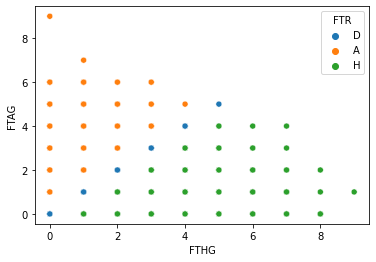

In [185]:
sns.scatterplot(data=soccer1, x='FTHG',y='FTAG',hue='FTR')

<AxesSubplot:xlabel='HF', ylabel='AF'>

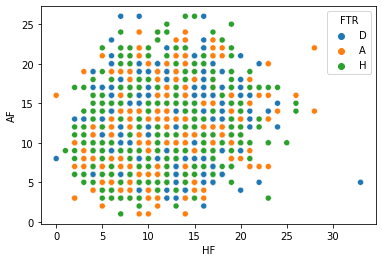

In [184]:
sns.scatterplot(data=soccer1, x='HF',y='AF',hue="FTR")

In [182]:
fig = px.scatter_3d(
    soccer1,
    x='HF', 
    y='AF', 
    z='TotalFouls', 
    #size='FTR', 
    #symbol='',
    color='HomeTeam', 
    title='Soccer: Full time home goals vs away goals vs Total Fouls '
)
fig.update_layout(width=600, height=600, font_size=10, scene_camera=dict(eye=dict(x=2, y=2, z=0.1)))

fig.show()

In [198]:
fig = px.scatter_3d(
    MU,
    x='FTHG', 
    y='FTAG', 
    z='AF', 
    #size='FTR', 
    #symbol='',
    color='FTR', 
    title=''
)
fig.update_layout(width=600, height=600, font_size=10, scene_camera=dict(eye=dict(x=2, y=2, z=0.1)))

fig.show()

In [199]:
fig1 = px.scatter_3d(
    MU_home,
    x='FTHG', 
    y='FTAG', 
    z='AF', 
    #size='FTR', 
    #symbol='',
    color='FTR', 
    title=''
)
fig1.update_layout(width=600, height=600, font_size=10, scene_camera=dict(eye=dict(x=2, y=2, z=0.1)))

fig1.show()

In [200]:
fig2 = px.scatter_3d(
    MU_away,
    x='FTHG', 
    y='FTAG', 
    z='HF', 
    #size='FTR', 
    #symbol='',
    color='FTR', 
    title=''
)
fig2.update_layout(width=600, height=600, font_size=10, scene_camera=dict(eye=dict(x=2, y=2, z=0.1)))

fig2.show()